In [1]:
from glob import glob
import pandas as pd
import numpy as np
import yaml

import omnialigner as om
from omnialigner.omni_3D import Omni3D

%matplotlib inline
%load_ext autoreload
%autoreload 2


In [2]:
plt = om.pl.plt

# group_id = "COAD_02_18"
group_id = "COAD_01_4"
with open("../config/ANHIR/config_ANHIR.yaml", 'r') as f:
    template_string = f.read()
    config_info = yaml.load(template_string, Loader=yaml.FullLoader)

config_info["datasets"]["group"] = f"{group_id}"

om_data = Omni3D(config_info=config_info)
om_data

In [3]:
df_dataset = pd.read_csv("/cluster/home/bqhu_jh/projects/omni/config/ANHIR/data_ANHIR.csv", index_col=0).dropna()
df_anhir = pd.read_csv("/cluster/home/bqhu_jh/projects/scGaussian3dGen/data/ANHIR-2019/dataset_medium.csv", index_col=0)

detector = om.kp.init_detector("roma")

df_dataset = pd.read_csv("/cluster/home/bqhu_jh/projects/omni/config/ANHIR/data_ANHIR.csv", index_col=0)
df_sub =df_dataset[df_dataset["group"] == group_id]
sample_F = df_sub["sample"].values[0]
sample_M = df_sub["sample"].values[1]
i_line = int(group_id.split("_")[-1])
raw_group = "_".join(group_id.split("_")[:-1])    
file_F = df_anhir.loc[i_line, "Target landmarks"]
file_M = df_anhir.loc[i_line, "Source landmarks"]
lm_F = pd.read_csv(f"/cluster/home/bqhu_jh/projects/scGaussian3dGen/data/ANHIR-2019/landmarks/{file_F}", index_col=0)
lm_M = pd.read_csv(f"/cluster/home/bqhu_jh/projects/scGaussian3dGen/data/ANHIR-2019/landmarks/{file_M}", index_col=0)

np_lm_F = lm_F.values
np_lm_M = lm_M.values


Using coarse resolution (560, 560), and upsample res (1024, 1024)


Text(0.5, 1.0, 'M')

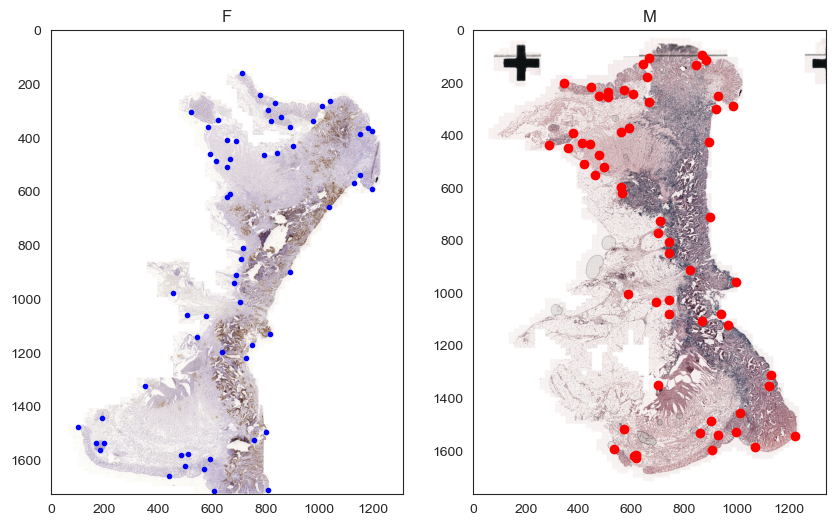

In [39]:
overwrite_cache = True

da_img_F = om_data.load_tiff(0, zoom_level=2)
da_img_M = om_data.load_tiff(1, zoom_level=2)
lm_F_ = np_lm_F / 8
lm_M_ = np_lm_M / 8


fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(1, 2, 1)
ax.imshow(da_img_F)
ax.plot(lm_F_[:, 0], lm_F_[:, 1], "b.")

ax.set_title("F")

ax = fig.add_subplot(1, 2, 2)
ax.imshow(da_img_M)
ax.plot(lm_M_[:, 0], lm_M_[:, 1], "ro")

ax.set_title("M")

Loading tiff images: 100%|██████████| 2/2 [00:00<00:00, 28.05it/s]


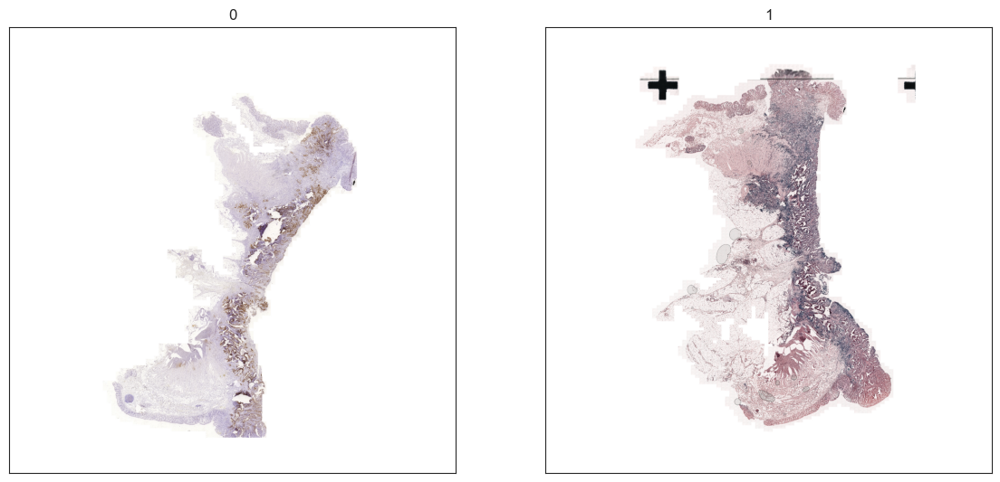

In [5]:
om.pp.pad(om_data, overwrite_cache=overwrite_cache)
om.pl.plot_nchw_2d(om_data, aligned_tag="PAD")

loading weights from: /cluster/home/bqhu_jh/share/miniconda3/envs/omni/lib/python3.10/site-packages/omnialigner/vendor/accelerated_features/modules/../weights/xfeat.pt


Processing frames: 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


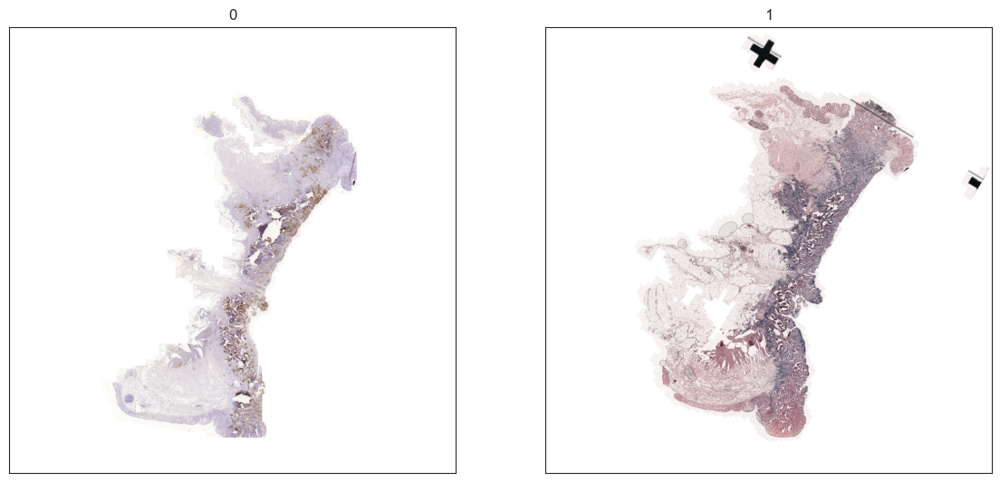

In [6]:
om.align.stack(om_data, overwrite_cache=overwrite_cache)
om.pl.plot_nchw_2d(om_data, aligned_tag="STACK")

create_pyramid 2
create_pyramid 1
create_pyramid 0
self.config_model {'model': 'omnialigner.align.models.grid_2d.TRSModuleDual', 'freezed_layers': [0], 'optimizer': {'optimizer_name': 'torch.optim.Adam', 'lr': 0.1}, 'scheduler': {'scheduler_name': 'torch.optim.lr_scheduler.CosineAnnealingWarmRestarts', 'T_0': 200, 'T_mult': 2}, 'tensor_resize': [600, 600], 'weight_image': 10.0, 'weight_kpts': 1000.0, 'weight_reg': 10.0, 'lambda_L1_angle': 1.0, 'lambda_L1_trans': 1.0, 'lambda_L1_scale': 1000.0, 'num_levels': 3, 'used_levels': 3, 'learning_rates': [0.1, 0.1, 0.05], 'iterations': [200, 200, 200], 'trs_save_prefix': ['rotation', 'tx', 'ty', 'kx', 'ky']}


epoch 0 iter: 100%|██████████| 200/200 [00:14<00:00, 13.52it/s]


layer 0-1, Epoch 1/3, Loss: 9.9285


epoch 1 iter: 100%|██████████| 200/200 [00:04<00:00, 44.43it/s]


layer 0-1, Epoch 2/3, Loss: 8.2855


epoch 2 iter: 100%|██████████| 200/200 [00:05<00:00, 38.76it/s]


layer 0-1, Epoch 3/3, Loss: 8.2296


100%|██████████| 1/1 [00:00<00:00, 10.94it/s]


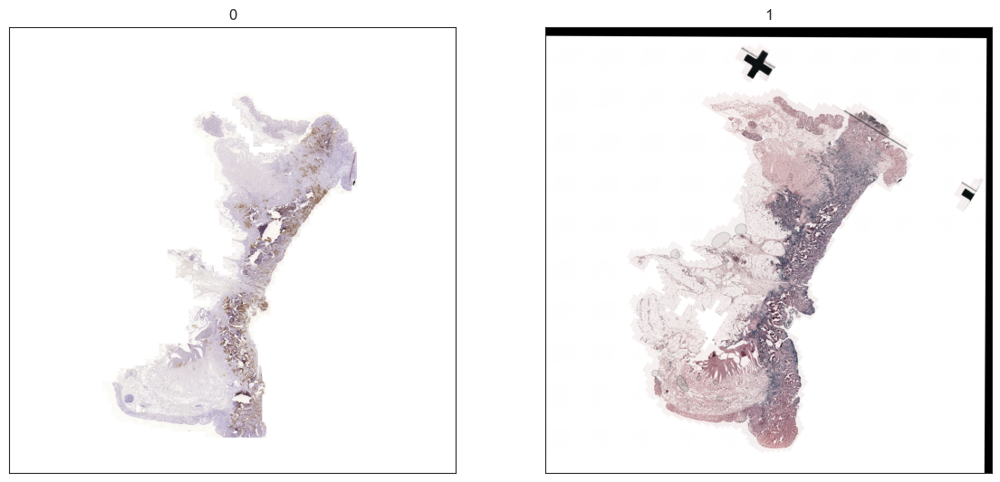

In [7]:
om.align.affine(om_data, overwrite_cache=overwrite_cache)
om.pl.plot_nchw_2d(om_data, aligned_tag="AFFINE")

create_pyramid 7
create_pyramid 6
create_pyramid 5
create_pyramid 4
create_pyramid 3
create_pyramid 2
create_pyramid 1
create_pyramid 0
self.config_model {'model': 'omnialigner.align.models.grid_2d.DeeperHistRegModule', 'n_keypoints': 1000, 'freezed_layers': [0], 'optimizer': {'optimizer_name': 'torch.optim.Adam', 'lr': 0.0005}, 'scheduler': {'scheduler_name': 'torch.optim.lr_scheduler.CosineAnnealingWarmRestarts', 'T_0': 70, 'T_mult': 2}, 'tensor_resize': [600, 600], 'weight_image': 10, 'weight_reg': 50, 'weight_kpts': 100.0, 'grid_size': 16, 'show_ovlp': True, 'cost_function': {'ncc_local': {'weight': 1.0, 'params': {'win_size': 7}}}, 'registration_size': 8192, 'regularization_function': {'omnialigner.metrics.diffusion_relative': {'weight': 1.0, 'params': {}}, 'omnialigner.metrics.l1_mean': {'weight': 1, 'params': {'p': 1}}}, 'num_levels': 8, 'used_levels': 6, 'learning_rates': [0.0005, 0.0004, 0.0003, 0.0002, 0.0001, 5e-05], 'iterations': [20, 20, 20, 20, 20, 40], 'alphas': [0.045, 

epoch 0 iter: 100%|██████████| 20/20 [00:02<00:00,  9.80it/s]


layer 0-1, Epoch 1/6, Loss: 4.6670


epoch 1 iter: 100%|██████████| 20/20 [00:01<00:00, 10.73it/s]


layer 0-1, Epoch 2/6, Loss: 5.1052


epoch 2 iter: 100%|██████████| 20/20 [00:02<00:00,  9.04it/s]


layer 0-1, Epoch 3/6, Loss: 5.9461


epoch 3 iter: 100%|██████████| 20/20 [00:01<00:00, 10.96it/s]


layer 0-1, Epoch 4/6, Loss: 7.0283


epoch 4 iter: 100%|██████████| 20/20 [00:01<00:00, 11.08it/s]


layer 0-1, Epoch 5/6, Loss: 7.4026


epoch 5 iter: 100%|██████████| 40/40 [00:03<00:00, 12.65it/s]


layer 0-1, Epoch 6/6, Loss: 7.5410


100%|██████████| 1/1 [00:00<00:00, 10.48it/s]


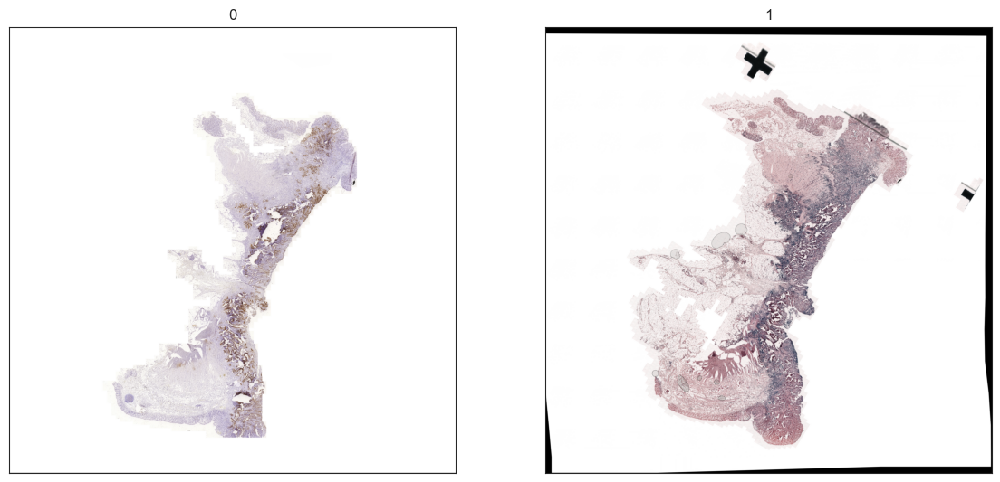

In [34]:
om.align.nonrigid(om_data, overwrite_cache=True)
om.pl.plot_nchw_2d(om_data, aligned_tag="NONRIGID")

In [35]:
import torch

from omnialigner.cache_files import StageTag
from omnialigner.align.nonrigid_HD import init_nonrigid_model

grid_model = init_nonrigid_model(om_data, 1)
file_grid_model = StageTag.NONRIGID.get_file_name(om_data.proj_info)["nonrigid_model"]
grid_model
# dict_params = torch.load(file_grid_model, map_location="cpu")
# dict_params["1.displacement_field"]

DeeperHistRegModule()

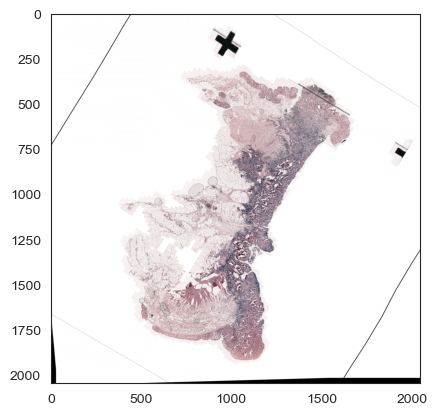

In [36]:
da_img_M = om.align.apply_nonrigid_HD(om_data, i_layer=1, tag="raw", overwrite_cache=True, unpad=False)
plt.imshow(da_img_M)

Text(0.5, 1.0, 'rtre=1.05e-02')

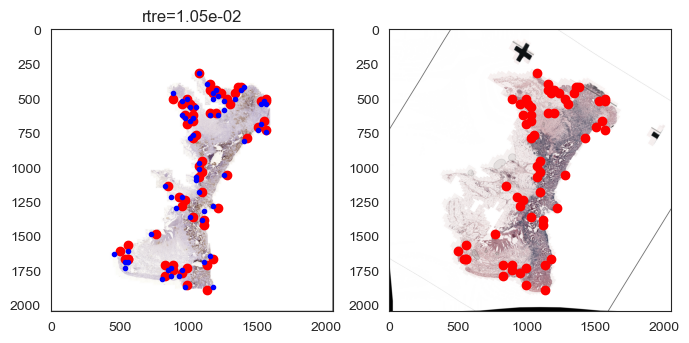

In [58]:
from omnialigner.preprocessing.pad import pad_apply_to_omic_inputs, get_pad_size

zoom_level = 2
om_data.set_zoom_level(zoom_level)

da_img_F = om.align.apply_affine_HD(om_data, i_layer=0,tag="raw", overwrite_cache=True, unpad=False)
lm_F = om.align.apply_nonrigid_landmarks_HD(om_data, i_layer=0, keypoints_raw=lm_F_.copy(), zoom_level=zoom_level, unpad=False)
pad_size = get_pad_size(om_data, i_layer=0, zoom_level=om_data.zoom_level)

da_img_M = om.align.apply_nonrigid_HD(om_data, i_layer=1, tag="raw", overwrite_cache=True, unpad=False)
lm_M = om.align.apply_nonrigid_landmarks_HD(om_data, i_layer=1, keypoints_raw=lm_M_.copy(), zoom_level=zoom_level, unpad=False)

fig = plt.figure(figsize=(8, 5))

ax1 = fig.add_subplot(1, 2, 1)
ax1.imshow(da_img_F)

ax2 = fig.add_subplot(1, 2, 2)
ax2.imshow(da_img_M)
ax2.plot(lm_M[:, 0], lm_M[:, 1], "ro")


# lm_M[:, 0] -= pad_size[1][0]
# lm_M[:, 1] -= pad_size[0][0]


ax1.plot(lm_M[:, 0], lm_M[:, 1], "ro")
ax1.plot(lm_F[:, 0], lm_F[:, 1], "b.")
img_diag = np.sqrt(da_img_F.shape[0]**2+da_img_F.shape[1]**2)
rtre = np.mean(om.metrics.rtre(lm_F, lm_M, img_diag).numpy())
ax1.set_title(f"rtre={rtre:.2e}")

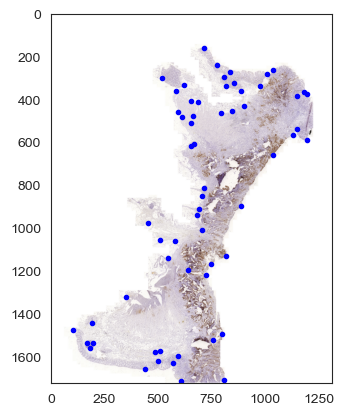

In [44]:
da_img_F = om_data.load_tiff(0, zoom_level=2)
plt.imshow(da_img_F)
plt.plot(lm_F_[:, 0], lm_F_[:, 1], "b.")


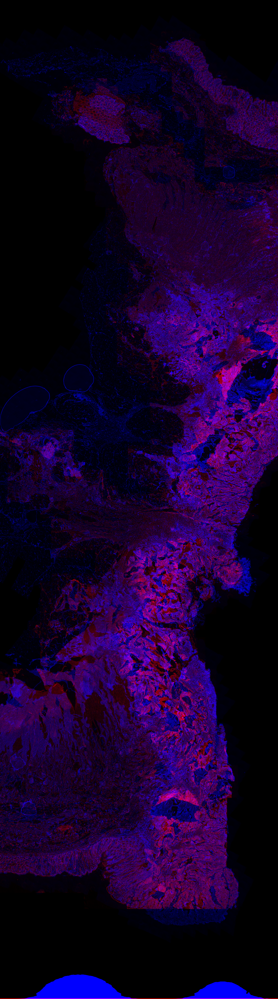

In [32]:
from PIL import Image 

i_beg, i_end = 500, 1500
j_beg, j_end = 1500, 2500
np_mat = 255-da_img_F[i_beg:i_end, j_beg:j_end, :].compute()
np_mat[:, :, 1] = 0
np_mat[:, :, 2] = 255-da_img_M[i_beg:i_end, j_beg:j_end, 0]


Image.fromarray(np_mat)

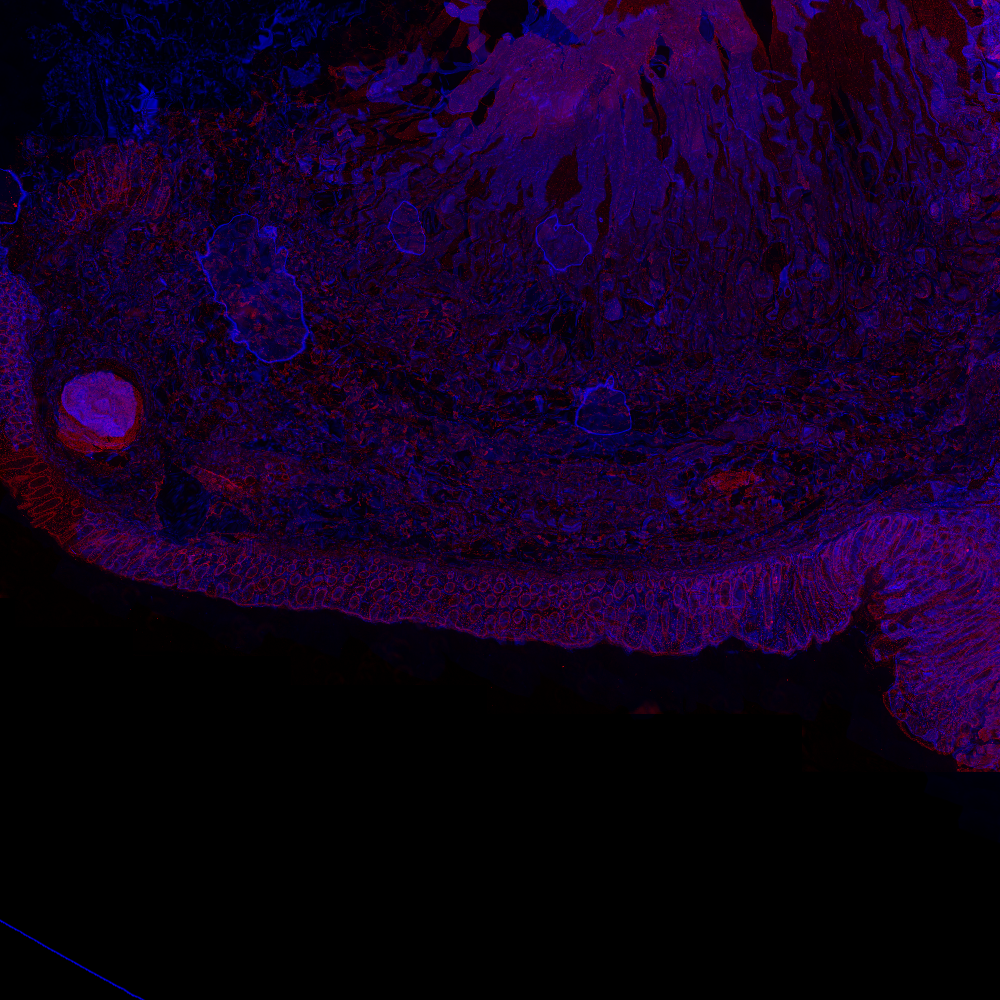

In [13]:
zoom_level = 1
om_data.set_zoom_level(zoom_level)


da_img_M = om.align.apply_nonrigid_HD(om_data, i_layer=1, tag="raw", overwrite_cache=True, unpad=True)
lm_M = om.align.apply_nonrigid_landmarks_HD(om_data, i_layer=1, keypoints_raw=lm_M_.copy(), zoom_level=zoom_level, unpad=True)
da_img_M

AAA
DISP: torch.Size([1, 20480, 20480, 2])
tensor_affine: torch.Size([1, 3, 4096, 4096])
tensor_nonrigid: torch.Size([1, 3, 4096, 4096])
pad_size: ((280, 280), (700, 700), (0, 0))


dask.array<getitem, shape=(3536, 2696, 3), dtype=uint8, chunksize=(3536, 2696, 1), chunktype=numpy.ndarray>

In [18]:
k1 = om.align.apply_nonrigid_landmarks_HD(om_data, i_layer=0, keypoints_raw=lm_F_.copy(), zoom_level=1, unpad=False)
k2 = om.align.apply_nonrigid_landmarks_HD(om_data, i_layer=0, keypoints_raw=lm_F_.copy(), zoom_level=2, unpad=False)
print(k1[0, :], k2[0, :])

tensor([1585.1520,  643.0720]) tensor([1224.7040,  479.2321])


In [48]:
import torch
dict_model = torch.load("/cluster/home/bqhu_jh/projects/scGaussian3dGen//analysis/ANHIR/paired/05.align3d/COAD_01_4//nonrigid_model.pt")
dict_model["0.displacement_field"].shape

torch.Size([1, 14, 14, 2])

In [49]:
grid_module = init_nonrigid_model(om_data, 1)
grid_module.disp

tensor([[[[-7.3388e-07,  1.0708e-02],
          [-4.8280e-06,  1.1073e-02]],

         [[-2.0526e-06,  3.0174e-03],
          [-1.9670e-06,  1.0729e-06]],

         [[ 3.3528e-07, -8.0344e-04],
          [-2.6226e-06, -6.1673e-03]],

         [[ 2.1718e-06,  2.2479e-06],
          [ 4.4227e-05, -4.4250e-03]],

         [[-1.1660e-06,  4.0191e-06],
          [ 4.8137e-04, -1.2818e-03]],

         [[ 5.8271e-05, -8.6444e-05],
          [ 1.0157e-03, -1.1580e-06]],

         [[ 2.1085e-06, -8.4468e-06],
          [ 1.5174e-03, -1.3127e-04]],

         [[ 2.1681e-06,  2.0640e-05],
          [ 1.2171e-03,  7.5613e-06]],

         [[ 4.0086e-04,  1.3624e-07],
          [ 5.7220e-06,  9.0912e-04]],

         [[ 2.0601e-06,  1.3965e-04],
          [ 3.1447e-03, -1.3624e-07]],

         [[ 1.6034e-05,  3.9373e-05],
          [-1.0431e-05,  1.6076e-05]],

         [[-1.5457e-03, -7.7357e-04],
          [-1.7932e-02,  6.4144e-03]],

         [[-1.5201e-02, -1.5523e-03],
          [-2.7956e-02,  1

In [53]:
grid_module.displacement_field

Parameter containing:
tensor([[[[-1.2001e+00, -1.1872e+00],
          [-1.0001e+00, -1.1872e+00],
          [-8.0006e-01, -1.1872e+00],
          [-6.0000e-01, -1.2000e+00],
          [-4.0000e-01, -1.2000e+00],
          [-1.9921e-01, -1.1858e+00],
          [ 7.9000e-04, -1.1858e+00],
          [ 2.0079e-01, -1.1858e+00],
          [ 4.0000e-01, -1.2000e+00],
          [ 6.0000e-01, -1.2000e+00],
          [ 8.0000e-01, -1.2000e+00],
          [ 1.0000e+00, -1.2000e+00],
          [ 1.2000e+00, -1.2000e+00],
          [ 1.4000e+00, -1.2000e+00]],

         [[-1.2000e+00, -9.8644e-01],
          [-9.9998e-01, -9.8644e-01],
          [-7.9998e-01, -9.8644e-01],
          [-6.0000e-01, -1.0000e+00],
          [-4.0000e-01, -1.0000e+00],
          [-2.0024e-01, -9.8492e-01],
          [-2.4176e-04, -9.8492e-01],
          [ 1.9976e-01, -9.8492e-01],
          [ 4.0000e-01, -1.0000e+00],
          [ 6.0000e-01, -1.0000e+00],
          [ 8.0000e-01, -1.0000e+00],
          [ 1.0000e+00, -1

In [54]:
grid_module.displacement_field.shape

torch.Size([1, 14, 14, 2])

In [57]:
from omnialigner.align.models.grid_2d.bsplines import b_splines


b_splines(
                    grid_module.displacement_field.permute(0, 3, 1, 2),
                    grid_module.displacement_field,
                    grid_module.cp_spacing,
                    splines_type=grid_module.splines_type,
                    normalize=True
).shape

torch.Size([1, 14, 14, 2])